In [1]:
import time
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import OrdinalEncoder
from sklearn.compose import ColumnTransformer
import time

%matplotlib inline

from pgmpy.estimators import BayesianEstimator
from pgmpy.models import BayesianModel
from pgmpy.inference import VariableElimination
from pgmpy.factors.discrete import State
from pgmpy.sampling import BayesianModelSampling
from pgmpy.sampling import GibbsSampling
import networkx as nx

C:\Users\dr.wagan\AppData\Local\anaconda3\envs\thirdpaper\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
updated_df = pd.read_csv('corona_tested_individuals_ver_0083.english.csv')
df_test = pd.read_csv('corona_tested_individuals_ver_006.english.csv',na_values="None")

C:\Users\dr.wagan\AppData\Local\anaconda3\envs\thirdpaper\lib\site-packages\IPython\core\interactiveshell.py:3553: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [3]:
df_test['age_60_and_above'].fillna('No', inplace=True)
updated_df['age_60_and_above'].fillna('No', inplace=True)

In [4]:

# Assuming df_test is your DataFrame
df_test.dropna(subset=['cough', 'fever'], inplace=True)

In [5]:
import pandas as pd
import numpy as np

# Assuming you have a DataFrame 'updated_df' with a column 'gender' containing null values

# Filter the DataFrame to get the indices of null gender values
null_indices = updated_df[updated_df['gender'].isnull()].index

# Calculate the number of null records and the desired half records
null_records = len(null_indices)
half_null_records = null_records // 2

# Generate an array of "male" and "female" values with equal length to half of the null records
gender_values = np.repeat(["male", "female"], [half_null_records, half_null_records])

# If there are remaining null records, assign them randomly between "male" and "female"
remaining_records = null_records % 2
if remaining_records > 0:
    random_indices = np.random.choice(2, size=remaining_records)
    random_gender = np.array(["male", "female"])[random_indices]
    gender_values = np.concatenate([gender_values, random_gender])

# Shuffle the gender values to distribute them randomly
np.random.shuffle(gender_values)

# Assign the generated gender values to the null values in the DataFrame
updated_df.loc[null_indices, 'gender'] = gender_values

# Print a sample of the resulting DataFrame


In [6]:
import pandas as pd
import numpy as np

# Assuming you have a DataFrame 'df_test' with a column 'gender' containing null values

# Filter the DataFrame to get the indices of null gender values
null_indices = df_test[df_test['gender'].isnull()].index

# Calculate the number of null records and the desired half records
null_records = len(null_indices)
half_null_records = null_records // 2

# Generate an array of "male" and "female" values with equal length to half of the null records
gender_values = np.repeat(["male", "female"], [half_null_records, half_null_records])

# If there are remaining null records, assign them randomly between "male" and "female"
remaining_records = null_records % 2
if remaining_records > 0:
    random_indices = np.random.choice(2, size=remaining_records)
    random_gender = np.array(["male", "female"])[random_indices]
    gender_values = np.concatenate([gender_values, random_gender])

# Shuffle the gender values to distribute them randomly
np.random.shuffle(gender_values)

# Assign the generated gender values to the null values in the DataFrame
df_test.loc[null_indices, 'gender'] = gender_values


In [7]:
cleanup_nums = {"corona_result":                                         {"other": 2, "negative": 0, "positive": 1},
          
                    "age_60_and_above":                                      {"Yes": 1, "No": 0 },
                  
                    "gender":                                                {"male": 1, "female": 0 },
                    "test_indication":                                       {"Contact with confirmed": 1, "Abroad": 2, "Other": 3},}

In [8]:
updated_df1=updated_df.replace(cleanup_nums)
df_test=df_test.replace(cleanup_nums)

In [9]:
mixed_type_columns = []

for col in df_test.columns:
    if len(df_test[col].apply(type).unique()) > 1:
        mixed_type_columns.append(col)

print("Columns with mixed data types:", mixed_type_columns)

Columns with mixed data types: []


In [10]:
architecture= [("test_date", "corona_result"),
                   
                      
                       ("cough", "corona_result"),
                       ("fever", "corona_result"),
                    
                       ("sore_throat", "corona_result"),
                       ("shortness_of_breath", "corona_result"),
                       ("head_ache", "corona_result"),
                       ("age_60_and_above", "corona_result"),
                       ("test_indication", "corona_result"),
                       ("gender", "corona_result")]

In [11]:
model = BayesianModel(architecture)

In [12]:
nodes = list(model.nodes())
edges = list(model.edges())

print('The nodes of the net are: {}'.format(nodes))
print('The edges of the net are: {}'.format(edges))

The nodes of the net are: ['test_date', 'corona_result', 'cough', 'fever', 'sore_throat', 'shortness_of_breath', 'head_ache', 'age_60_and_above', 'test_indication', 'gender']
The edges of the net are: [('test_date', 'corona_result'), ('cough', 'corona_result'), ('fever', 'corona_result'), ('sore_throat', 'corona_result'), ('shortness_of_breath', 'corona_result'), ('head_ache', 'corona_result'), ('age_60_and_above', 'corona_result'), ('test_indication', 'corona_result'), ('gender', 'corona_result')]


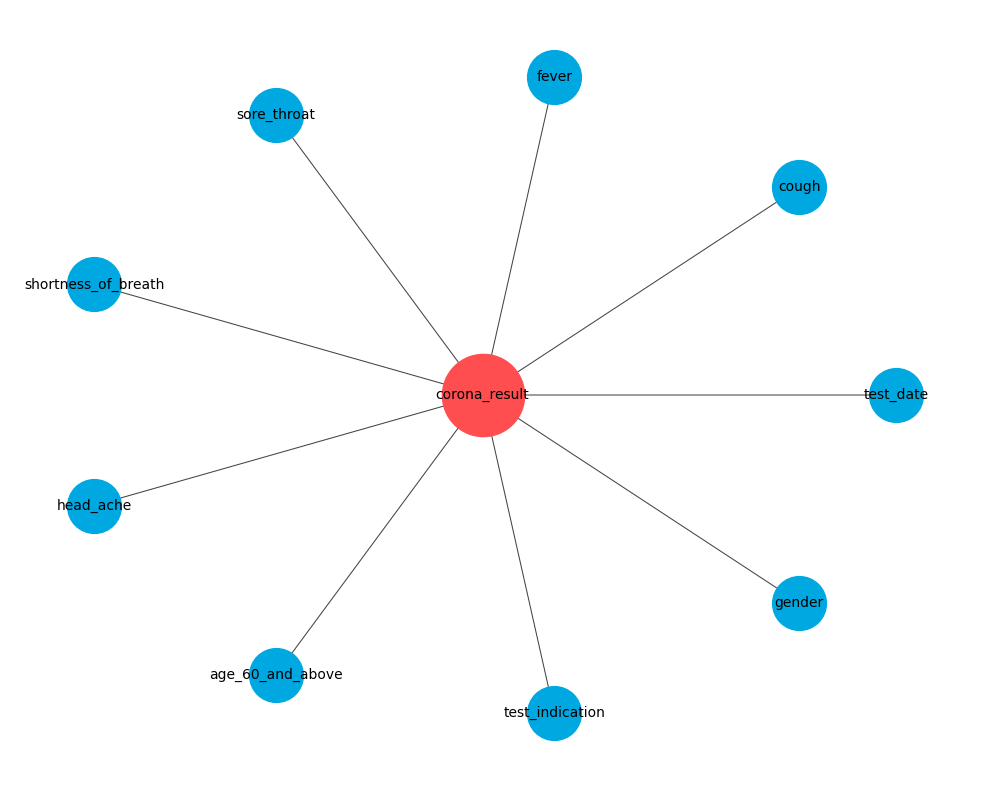

In [13]:
import networkx as nx
import matplotlib.pyplot as plt

# Define the architecture of the Bayesian Network
architecture= [("test_date", "corona_result"),
                   
                      
                       ("cough", "corona_result"),
                       ("fever", "corona_result"),
                    
                       ("sore_throat", "corona_result"),
                       ("shortness_of_breath", "corona_result"),
                       ("head_ache", "corona_result"),
                       ("age_60_and_above", "corona_result"),
                       ("test_indication", "corona_result"),
                       ("gender", "corona_result")]

# Create a directed graph and add edges
DAG = nx.DiGraph()
DAG.add_edges_from(architecture)

# Define node positions and layout
symptom_nodes = [node for node in DAG.nodes if node != 'corona_result']
pos = nx.circular_layout(symptom_nodes)

# Set the position of the disease node at the center
pos['corona_result'] = (0, 0)

# Render the graph using matplotlib
fig, ax = plt.subplots(figsize=(10, 8))

# Draw symptom nodes with a vibrant turquoise color
nx.draw_networkx_nodes(DAG, pos, nodelist=symptom_nodes, node_color='#00A8E1', node_size=1500)

# Draw disease node in a bright red color with larger size
nx.draw_networkx_nodes(DAG, pos, nodelist=['corona_result'], node_color='#FF4E50', node_size=3500)

nx.draw_networkx_labels(DAG, pos, font_size=10, font_color='black')

# Draw edges with a darker gray color and smaller width
nx.draw_networkx_edges(DAG, pos, edge_color='#444444', width=0.75, arrows=True)


plt.axis('off')
plt.tight_layout()

plt.show()


In [14]:
from IPython.core.display import display, HTML

# disable text wrapping in output cell
display(HTML(""))

model.cpds = []
model.fit(  data=updated_df1
          , estimator=BayesianEstimator
          , prior_type="BDeu"
          , equivalent_sample_size=10
          ,complete_samples_only=False)

print(f'Check model: {model.check_model()}\n')
for cpd in model.get_cpds():
    print(f'CPT of {cpd.variable}:')
    print(cpd, '\n')

Check model: True

CPT of test_date:
+-----------------------+-------------+
| test_date(2020-03-11) | 0.0001331   |
+-----------------------+-------------+
| test_date(2020-03-12) | 0.000231911 |
+-----------------------+-------------+
| test_date(2020-03-13) | 0.000269831 |
+-----------------------+-------------+
| test_date(2020-03-14) | 0.000266914 |
+-----------------------+-------------+
| test_date(2020-03-15) | 0.000405469 |
+-----------------------+-------------+
| test_date(2020-03-16) | 0.00053272  |
+-----------------------+-------------+
| test_date(2020-03-17) | 0.000559337 |
+-----------------------+-------------+
| test_date(2020-03-18) | 0.000763887 |
+-----------------------+-------------+
| test_date(2020-03-19) | 0.000828789 |
+-----------------------+-------------+
| test_date(2020-03-20) | 0.000696433 |
+-----------------------+-------------+
| test_date(2020-03-21) | 0.00064174  |
+-----------------------+-------------+
| test_date(2020-03-22) | 0.00131446  |
+--

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [15]:
from pgmpy.inference import VariableElimination
infer =VariableElimination(model)

CAUSAL REASONING:



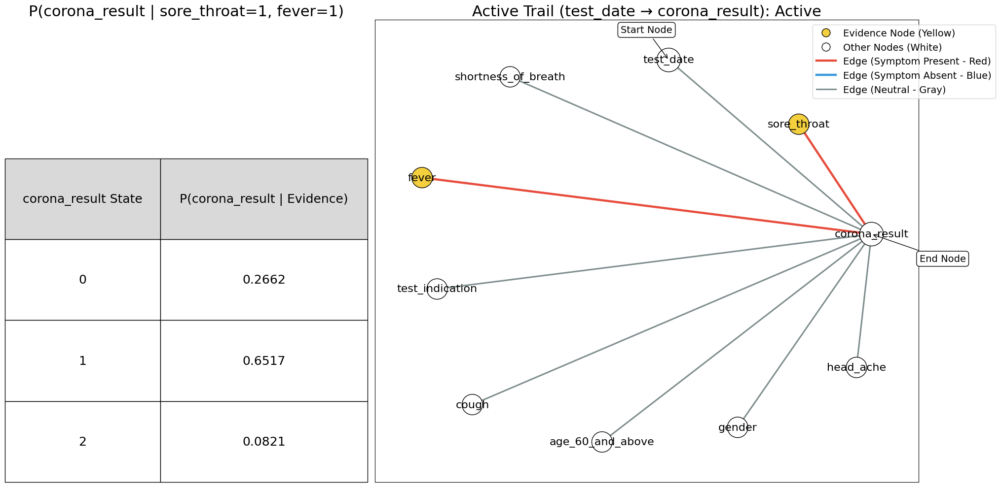


-------------------------------------------------------------------------------------------------------------

CAUSAL REASONING:



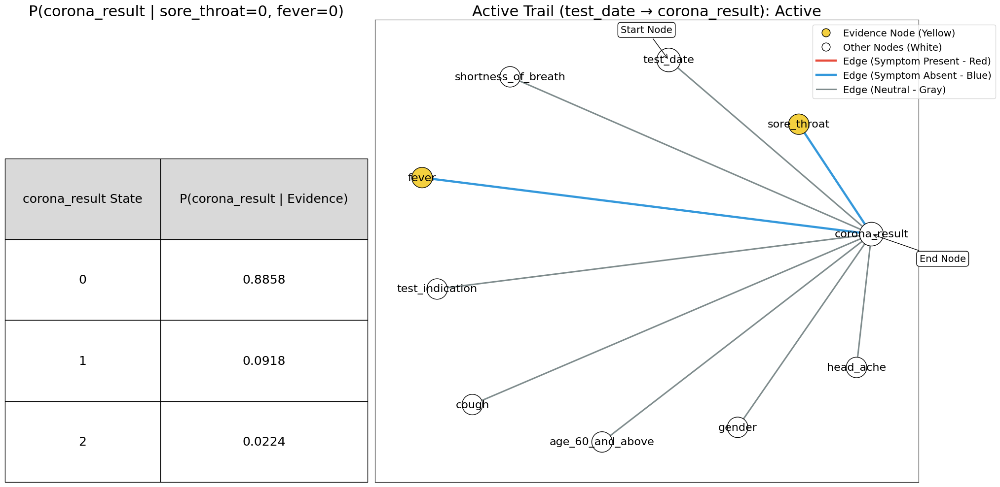

In [16]:
def show_active_trail(model, start, end, evidences={}, trail_to_show=[]):
    import matplotlib.pyplot as plt
    import networkx as nx
    import numpy as np
    from pgmpy.inference import VariableElimination

    # Prepare the evidence string for the title
    str_evidences = '| ' if len(evidences) > 0 else ''
    for evidence, value in evidences.items():
        str_evidences += evidence + '=' + str(value)
        if evidence != list(evidences.keys())[-1]:  # Check whether it is last
            str_evidences += ', '
    
    title_inference = f'P({end} {str_evidences})'

    # Prepare the figure (wider for better alignment)
    fig = plt.figure(figsize=(20, 10))
    ax1, ax2 = fig.subplots(nrows=1, ncols=2, gridspec_kw={'width_ratios': [1.2, 1.8]})

    # Compute query
    inference = VariableElimination(model)
    query = inference.query(variables=[end], evidence=evidences, show_progress=False)
  
    # Use raw probabilities instead of percentages
    probabilities = [f'{value:.4f}' for value in query.values]
    table = np.column_stack((query.state_names[query.variables[0]], probabilities))

    # Plot inference table
    font_size = 18
    bbox = [0, 0, 1, 0.70]  # Adjusted for better spacing
    mpl_table = ax1.table(cellText=table,
                          bbox=bbox,
                          cellLoc='center',
                          colLabels=[f'{end} State', f'P({end} | Evidence)'],
                          colWidths=[1.5, 2],
                          loc='center',
                          colColours=['#d9d9d9', '#d9d9d9'])
    mpl_table.auto_set_font_size(False)
    mpl_table.set_fontsize(font_size)
    ax1.axis('off')
    ax1.set_title(title_inference, fontsize=22)
  
    # Check for active trail
    obs = list(evidences.keys()).copy()
    if start in obs:
        obs.remove(start)
    active = model.is_active_trail(start=start, end=end, observed=obs)
    title_graph = f"Active Trail ({start} → {end}): {'Active' if active else 'Inactive'}"

    # Prepare nodes and edges for the graph
    trail_edges = [edge for edge in model.edges if edge[0] in trail_to_show and edge[1] in trail_to_show]

    node_colors = ['#f4d03f' if node in evidences else '#ffffff' for node in trail_to_show]
    node_sizes = [1200 if node in [start, end] else 900 for node in trail_to_show]
    edge_colors = ['#e74c3c' if (edge[0] in evidences and evidences[edge[0]] == 1) else 
                   '#3498db' if (edge[0] in evidences and evidences[edge[0]] == 0) else '#7f8c8d' 
                   for edge in trail_edges]
    edge_widths = [3.2 if edge[0] in evidences else 2.2 for edge in trail_edges]

    # Plot graph
    pos = nx.spring_layout(model, seed=42)
    nx.draw_networkx_edges(model, pos, edgelist=trail_edges, edge_color=edge_colors, width=edge_widths, ax=ax2, arrows=True)
    nx.draw_networkx_nodes(model, pos, nodelist=trail_to_show, node_color=node_colors, edgecolors='black', node_size=node_sizes, ax=ax2)
    nx.draw_networkx_labels(model, pos, ax=ax2, font_size=16)

    # Highlight start and end nodes
    ax2.annotate('Start Node', xy=pos[start], xycoords='data',
                 xytext=(-70, 40), textcoords='offset points',
                 arrowprops=dict(arrowstyle="->", connectionstyle="arc3"),
                 fontsize=14, bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))
    ax2.annotate('End Node', xy=pos[end], xycoords='data',
                 xytext=(70, -40), textcoords='offset points',
                 arrowprops=dict(arrowstyle="->", connectionstyle="arc3"),
                 fontsize=14, bbox=dict(boxstyle="round,pad=0.3", edgecolor='black', facecolor='white'))

    # Add legend at the top right corner
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label='Evidence Node (Yellow)', 
                                  markerfacecolor='#f4d03f', markersize=12, markeredgecolor='black'),
                       plt.Line2D([0], [0], marker='o', color='w', label='Other Nodes (White)', 
                                  markerfacecolor='#ffffff', markersize=12, markeredgecolor='black'),
                       plt.Line2D([0], [0], color='#e74c3c', lw=3.2, label='Edge (Symptom Present - Red)'),
                       plt.Line2D([0], [0], color='#3498db', lw=3.2, label='Edge (Symptom Absent - Blue)'),
                       plt.Line2D([0], [0], color='#7f8c8d', lw=2.2, label='Edge (Neutral - Gray)')]
    ax2.legend(handles=legend_elements, loc='upper right', fontsize=14, bbox_to_anchor=(1.15, 1))

    ax2.set_title(title_graph, fontsize=22)

    plt.tight_layout()
    plt.show()

print("CAUSAL REASONING:\n")

show_active_trail(model,
                  start='test_date',
                  end='corona_result',
                  evidences={'sore_throat': 1, 'fever': 1},
                  trail_to_show=['test_date', 'cough', 'fever', 'sore_throat', 'shortness_of_breath', 'head_ache', 'corona_result', 'age_60_and_above', 'gender', 'test_indication'])

print("\n-------------------------------------------------------------------------------------------------------------\n")

print("CAUSAL REASONING:\n")

show_active_trail(model,
                  start='test_date',
                  end='corona_result',
                  evidences={'sore_throat': 0, 'fever': 0},
                  trail_to_show=['test_date', 'cough', 'fever', 'sore_throat', 'shortness_of_breath', 'head_ache', 'corona_result', 'age_60_and_above', 'gender', 'test_indication'])
   


CAUSAL REASONING:



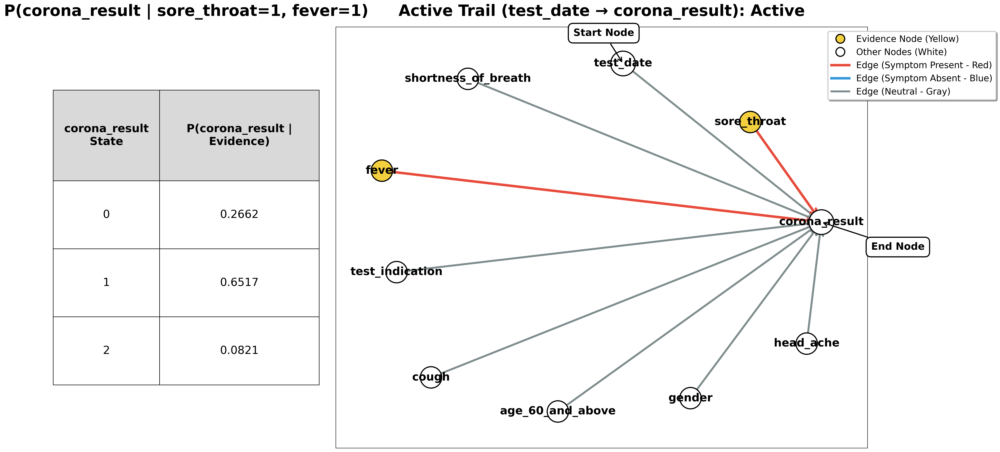


-------------------------------------------------------------------------------------------------------------

CAUSAL REASONING:



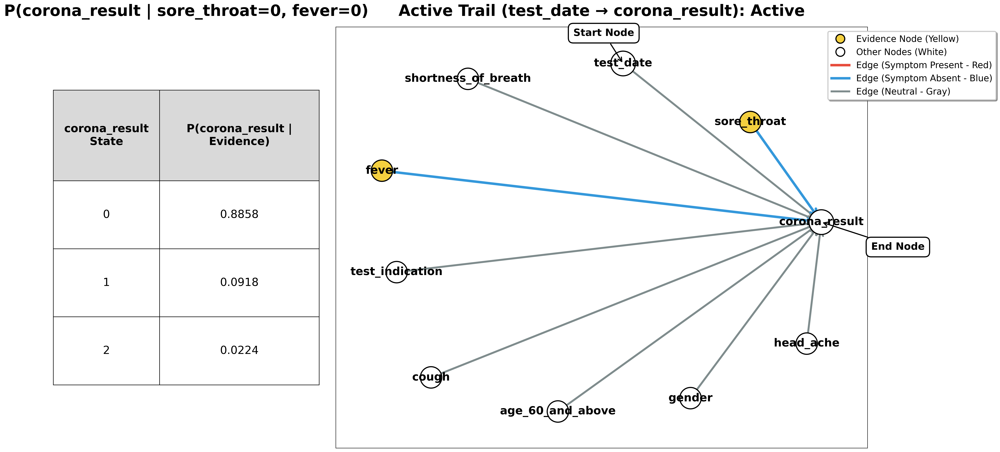

In [19]:
def show_active_trail(model, start, end, evidences={}, trail_to_show=[]):
    import matplotlib.pyplot as plt
    import networkx as nx
    import numpy as np
    from pgmpy.inference import VariableElimination

    # Prepare the evidence string for the title
    str_evidences = '| ' if len(evidences) > 0 else ''
    for evidence, value in evidences.items():
        str_evidences += evidence + '=' + str(value)
        if evidence != list(evidences.keys())[-1]:  # Check whether it is last
            str_evidences += ', '
    
    title_inference = f'P({end} {str_evidences})'

    # Prepare the figure with larger size and higher DPI for better quality
    fig = plt.figure(figsize=(24, 12), dpi=300)
    ax1, ax2 = fig.subplots(nrows=1, ncols=2, gridspec_kw={'width_ratios': [1.0, 2.0]})

    # Compute query
    inference = VariableElimination(model)
    query = inference.query(variables=[end], evidence=evidences, show_progress=False)
  
    # Use raw probabilities instead of percentages
    probabilities = [f'{value:.4f}' for value in query.values]
    table = np.column_stack((query.state_names[query.variables[0]], probabilities))

    # Plot inference table with larger fonts
    table_font_size = 20  # Slightly reduced to fit better
    bbox = [0, 0.15, 1, 0.7]  # Adjusted for better spacing and header visibility
    mpl_table = ax1.table(cellText=table,
                          bbox=bbox,
                          cellLoc='center',
                          colLabels=[f'{end}\nState', f'P({end} |\nEvidence)'],  # Added line breaks
                          colWidths=[0.4, 0.6],  # Adjusted column widths
                          loc='center',
                          colColours=['#d9d9d9', '#d9d9d9'])
    mpl_table.auto_set_font_size(False)
    mpl_table.set_fontsize(table_font_size)
    
    # Make table cells taller for better readability
    for (i, j), cell in mpl_table.get_celld().items():
        if i == 0:  # Header row
            cell.set_height(0.2)  # Taller headers to accommodate line breaks
            cell.set_text_props(weight='bold', va='center', ha='center')
        else:
            cell.set_height(0.15)  # Data rows
            cell.set_text_props(weight='normal', va='center', ha='center')
    
    ax1.axis('off')
    ax1.set_title(title_inference, fontsize=28, fontweight='bold', pad=20)
  
    # Check for active trail
    obs = list(evidences.keys()).copy()
    if start in obs:
        obs.remove(start)
    active = model.is_active_trail(start=start, end=end, observed=obs)
    title_graph = f"Active Trail ({start} → {end}): {'Active' if active else 'Inactive'}"

    # Prepare nodes and edges for the graph
    trail_edges = [edge for edge in model.edges if edge[0] in trail_to_show and edge[1] in trail_to_show]

    node_colors = ['#f4d03f' if node in evidences else '#ffffff' for node in trail_to_show]
    node_sizes = [2000 if node in [start, end] else 1500 for node in trail_to_show]  # Larger nodes
    edge_colors = ['#e74c3c' if (edge[0] in evidences and evidences[edge[0]] == 1) else 
                   '#3498db' if (edge[0] in evidences and evidences[edge[0]] == 0) else '#7f8c8d' 
                   for edge in trail_edges]
    edge_widths = [4.5 if edge[0] in evidences else 3.5 for edge in trail_edges]  # Thicker edges

    # Plot graph with larger elements
    pos = nx.spring_layout(model, seed=42)
    nx.draw_networkx_edges(model, pos, edgelist=trail_edges, edge_color=edge_colors, 
                          width=edge_widths, ax=ax2, arrows=True, arrowsize=30, arrowstyle='->')
    nx.draw_networkx_nodes(model, pos, nodelist=trail_to_show, node_color=node_colors, 
                          edgecolors='black', linewidths=2, node_size=node_sizes, ax=ax2)
    nx.draw_networkx_labels(model, pos, ax=ax2, font_size=20, font_weight='bold')  # Larger node labels

    # Highlight start and end nodes with larger annotations
    ax2.annotate('Start Node', xy=pos[start], xycoords='data',
                 xytext=(-90, 50), textcoords='offset points',
                 arrowprops=dict(arrowstyle="->", connectionstyle="arc3", lw=2),
                 fontsize=18, fontweight='bold',
                 bbox=dict(boxstyle="round,pad=0.5", edgecolor='black', facecolor='white', linewidth=2))
    ax2.annotate('End Node', xy=pos[end], xycoords='data',
                 xytext=(90, -50), textcoords='offset points',
                 arrowprops=dict(arrowstyle="->", connectionstyle="arc3", lw=2),
                 fontsize=18, fontweight='bold',
                 bbox=dict(boxstyle="round,pad=0.5", edgecolor='black', facecolor='white', linewidth=2))

    # Add legend with larger elements and better positioning
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label='Evidence Node (Yellow)', 
                                  markerfacecolor='#f4d03f', markersize=16, markeredgecolor='black', markeredgewidth=2),
                       plt.Line2D([0], [0], marker='o', color='w', label='Other Nodes (White)', 
                                  markerfacecolor='#ffffff', markersize=16, markeredgecolor='black', markeredgewidth=2),
                       plt.Line2D([0], [0], color='#e74c3c', lw=4.5, label='Edge (Symptom Present - Red)'),
                       plt.Line2D([0], [0], color='#3498db', lw=4.5, label='Edge (Symptom Absent - Blue)'),
                       plt.Line2D([0], [0], color='#7f8c8d', lw=3.5, label='Edge (Neutral - Gray)')]
    
    legend = ax2.legend(handles=legend_elements, loc='upper right', fontsize=16, 
                       bbox_to_anchor=(1.25, 1), frameon=True, fancybox=True, shadow=True)
    legend.get_frame().set_linewidth(2)

    ax2.set_title(title_graph, fontsize=28, fontweight='bold', pad=20)

    # Adjust layout with more padding
    plt.tight_layout(pad=3.0)
    
    # Save with high DPI for publication quality (optional)
    # plt.savefig('active_trail_figure.png', dpi=300, bbox_inches='tight', 
    #             facecolor='white', edgecolor='none')
    
    plt.show()

print("CAUSAL REASONING:\n")

show_active_trail(model,
                  start='test_date',
                  end='corona_result',
                  evidences={'sore_throat': 1, 'fever': 1},
                  trail_to_show=['test_date', 'cough', 'fever', 'sore_throat', 'shortness_of_breath', 'head_ache', 'corona_result', 'age_60_and_above', 'gender', 'test_indication'])

print("\n-------------------------------------------------------------------------------------------------------------\n")

print("CAUSAL REASONING:\n")

show_active_trail(model,
                  start='test_date',
                  end='corona_result',
                  evidences={'sore_throat': 0, 'fever': 0},
                  trail_to_show=['test_date', 'cough', 'fever', 'sore_throat', 'shortness_of_breath', 'head_ache', 'corona_result', 'age_60_and_above', 'gender', 'test_indication'])

CAUSAL REASONING:



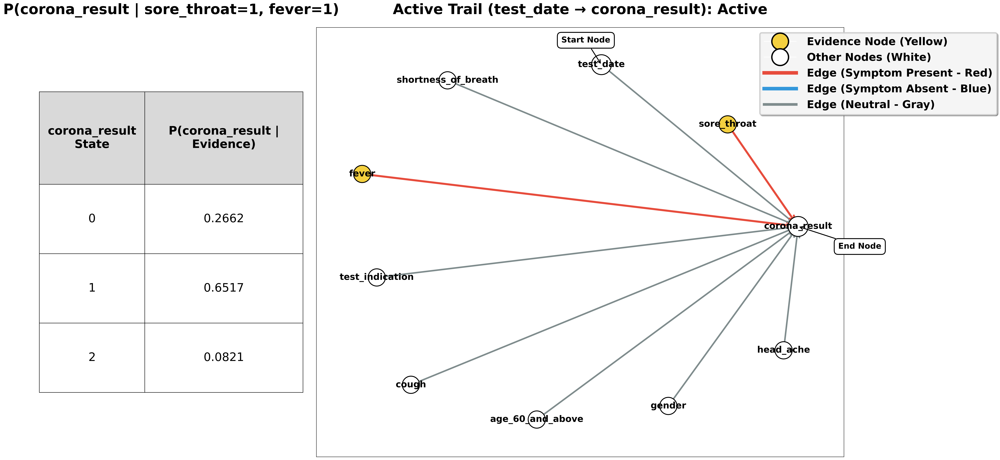


-------------------------------------------------------------------------------------------------------------

CAUSAL REASONING:



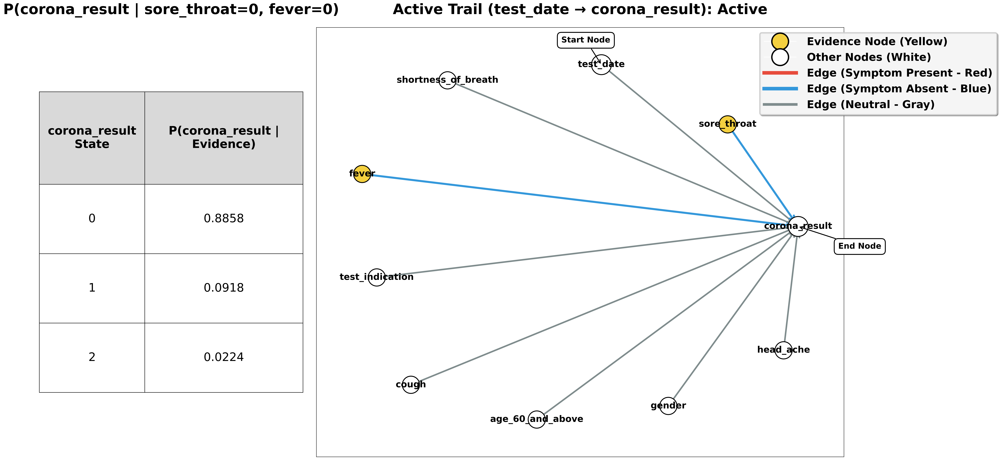

In [21]:
def show_active_trail(model, start, end, evidences={}, trail_to_show=[]):
    import matplotlib.pyplot as plt
    import networkx as nx
    import numpy as np
    from pgmpy.inference import VariableElimination

    # Prepare the evidence string for the title
    str_evidences = '| ' if len(evidences) > 0 else ''
    for evidence, value in evidences.items():
        str_evidences += evidence + '=' + str(value)
        if evidence != list(evidences.keys())[-1]:  # Check whether it is last
            str_evidences += ', '
    
    title_inference = f'P({end} {str_evidences})'

    # Prepare the figure with larger size and higher DPI for better quality
    fig = plt.figure(figsize=(30, 15), dpi=300)  # Increased overall size
    ax1, ax2 = fig.subplots(nrows=1, ncols=2, gridspec_kw={'width_ratios': [1.0, 2.0]})

    # Compute query
    inference = VariableElimination(model)
    query = inference.query(variables=[end], evidence=evidences, show_progress=False)
  
    # Use raw probabilities instead of percentages
    probabilities = [f'{value:.4f}' for value in query.values]
    table = np.column_stack((query.state_names[query.variables[0]], probabilities))

    # Plot inference table with larger fonts
    table_font_size = 26  # Increased for better visibility
    bbox = [0, 0.15, 1, 0.7]  # Adjusted for better spacing and header visibility
    mpl_table = ax1.table(cellText=table,
                          bbox=bbox,
                          cellLoc='center',
                          colLabels=[f'{end}\nState', f'P({end} |\nEvidence)'],  # Added line breaks
                          colWidths=[0.4, 0.6],  # Adjusted column widths
                          loc='center',
                          colColours=['#d9d9d9', '#d9d9d9'])
    mpl_table.auto_set_font_size(False)
    mpl_table.set_fontsize(table_font_size)
    
    # Make table cells taller for better readability
    for (i, j), cell in mpl_table.get_celld().items():
        if i == 0:  # Header row
            cell.set_height(0.2)  # Taller headers to accommodate line breaks
            cell.set_text_props(weight='bold', va='center', ha='center', fontsize=table_font_size)
        else:
            cell.set_height(0.15)  # Data rows
            cell.set_text_props(weight='normal', va='center', ha='center', fontsize=table_font_size)
    
    ax1.axis('off')
    ax1.set_title(title_inference, fontsize=32, fontweight='bold', pad=30)
  
    # Check for active trail
    obs = list(evidences.keys()).copy()
    if start in obs:
        obs.remove(start)
    active = model.is_active_trail(start=start, end=end, observed=obs)
    title_graph = f"Active Trail ({start} → {end}): {'Active' if active else 'Inactive'}"

    # Prepare nodes and edges for the graph
    trail_edges = [edge for edge in model.edges if edge[0] in trail_to_show and edge[1] in trail_to_show]

    node_colors = ['#f4d03f' if node in evidences else '#ffffff' for node in trail_to_show]
    node_sizes = [2000 if node in [start, end] else 1500 for node in trail_to_show]  # Larger nodes
    edge_colors = ['#e74c3c' if (edge[0] in evidences and evidences[edge[0]] == 1) else 
                   '#3498db' if (edge[0] in evidences and evidences[edge[0]] == 0) else '#7f8c8d' 
                   for edge in trail_edges]
    edge_widths = [4.5 if edge[0] in evidences else 3.5 for edge in trail_edges]  # Thicker edges

    # Plot graph with larger elements
    pos = nx.spring_layout(model, seed=42)
    nx.draw_networkx_edges(model, pos, edgelist=trail_edges, edge_color=edge_colors, 
                          width=edge_widths, ax=ax2, arrows=True, arrowsize=30, arrowstyle='->')
    nx.draw_networkx_nodes(model, pos, nodelist=trail_to_show, node_color=node_colors, 
                          edgecolors='black', linewidths=2, node_size=node_sizes, ax=ax2)
    nx.draw_networkx_labels(model, pos, ax=ax2, font_size=20, font_weight='bold')  # Larger node labels

    # Highlight start and end nodes with larger annotations
    ax2.annotate('Start Node', xy=pos[start], xycoords='data',
                 xytext=(-90, 50), textcoords='offset points',
                 arrowprops=dict(arrowstyle="->", connectionstyle="arc3", lw=2),
                 fontsize=18, fontweight='bold',
                 bbox=dict(boxstyle="round,pad=0.5", edgecolor='black', facecolor='white', linewidth=2))
    ax2.annotate('End Node', xy=pos[end], xycoords='data',
                 xytext=(90, -50), textcoords='offset points',
                 arrowprops=dict(arrowstyle="->", connectionstyle="arc3", lw=2),
                 fontsize=18, fontweight='bold',
                 bbox=dict(boxstyle="round,pad=0.5", edgecolor='black', facecolor='white', linewidth=2))

    # Add legend with larger elements and better positioning
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label='Evidence Node (Yellow)', 
                                  markerfacecolor='#f4d03f', markersize=25, markeredgecolor='black', markeredgewidth=3),
                       plt.Line2D([0], [0], marker='o', color='w', label='Other Nodes (White)', 
                                  markerfacecolor='#ffffff', markersize=25, markeredgecolor='black', markeredgewidth=3),
                       plt.Line2D([0], [0], color='#e74c3c', lw=8, label='Edge (Symptom Present - Red)'),
                       plt.Line2D([0], [0], color='#3498db', lw=8, label='Edge (Symptom Absent - Blue)'),
                       plt.Line2D([0], [0], color='#7f8c8d', lw=6, label='Edge (Neutral - Gray)')]
    
    legend = ax2.legend(handles=legend_elements, loc='upper right', fontsize=24, 
                       bbox_to_anchor=(1.3, 1), frameon=True, fancybox=True, shadow=True,
                       prop={'weight': 'bold', 'size': 24}, markerscale=1.5, handlelength=3, handletextpad=1)
    legend.get_frame().set_linewidth(3)
    legend.get_frame().set_facecolor('white')
    legend.get_frame().set_alpha(0.9)

    ax2.set_title(title_graph, fontsize=32, fontweight='bold', pad=30)

    # Adjust layout with more padding
    plt.tight_layout(pad=3.0)
    
    # Save with high DPI for publication quality (optional)
    # plt.savefig('active_trail_figure.png', dpi=300, bbox_inches='tight', 
    #             facecolor='white', edgecolor='none')
    
    plt.show()

print("CAUSAL REASONING:\n")

show_active_trail(model,
                  start='test_date',
                  end='corona_result',
                  evidences={'sore_throat': 1, 'fever': 1},
                  trail_to_show=['test_date', 'cough', 'fever', 'sore_throat', 'shortness_of_breath', 'head_ache', 'corona_result', 'age_60_and_above', 'gender', 'test_indication'])

print("\n-------------------------------------------------------------------------------------------------------------\n")

print("CAUSAL REASONING:\n")

show_active_trail(model,
                  start='test_date',
                  end='corona_result',
                  evidences={'sore_throat': 0, 'fever': 0},
                  trail_to_show=['test_date', 'cough', 'fever', 'sore_throat', 'shortness_of_breath', 'head_ache', 'corona_result', 'age_60_and_above', 'gender', 'test_indication'])

In [22]:
def show_active_trail(model, start, end, evidences={}, trail_to_show=[]):
    import matplotlib.pyplot as plt
    import networkx as nx
    import numpy as np
    from pgmpy.inference import VariableElimination

    # Prepare the evidence string for the title
    str_evidences = '| ' if len(evidences) > 0 else ''
    for evidence, value in evidences.items():
        str_evidences += evidence + '=' + str(value)
        if evidence != list(evidences.keys())[-1]:  # Check whether it is last
            str_evidences += ', '
    
    title_inference = f'P({end} {str_evidences})'

    # Prepare the figure with larger size and higher DPI for better quality
    fig = plt.figure(figsize=(36, 18), dpi=300)  # Further increased overall size
    ax1, ax2 = fig.subplots(nrows=1, ncols=2, gridspec_kw={'width_ratios': [1.0, 2.0]})

    # Compute query
    inference = VariableElimination(model)
    query = inference.query(variables=[end], evidence=evidences, show_progress=False)
  
    # Use raw probabilities instead of percentages
    probabilities = [f'{value:.4f}' for value in query.values]
    table = np.column_stack((query.state_names[query.variables[0]], probabilities))

    # Plot inference table with larger fonts
    table_font_size = 32  # Significantly increased for better visibility
    bbox = [0, 0.15, 1, 0.7]  # Adjusted for better spacing and header visibility
    mpl_table = ax1.table(cellText=table,
                          bbox=bbox,
                          cellLoc='center',
                          colLabels=[f'{end}\nState', f'P({end} |\nEvidence)'],  # Added line breaks
                          colWidths=[0.4, 0.6],  # Adjusted column widths
                          loc='center',
                          colColours=['#d9d9d9', '#d9d9d9'])
    mpl_table.auto_set_font_size(False)
    mpl_table.set_fontsize(table_font_size)
    
    # Make table cells taller for better readability
    for (i, j), cell in mpl_table.get_celld().items():
        if i == 0:  # Header row
            cell.set_height(0.25)  # Even taller headers to accommodate larger text
            cell.set_text_props(weight='bold', va='center', ha='center', fontsize=table_font_size)
        else:
            cell.set_height(0.2)  # Taller data rows for larger text
            cell.set_text_props(weight='bold', va='center', ha='center', fontsize=table_font_size)  # Made data bold too
    
    ax1.axis('off')
    ax1.set_title(title_inference, fontsize=36, fontweight='bold', pad=40)
  
    # Check for active trail
    obs = list(evidences.keys()).copy()
    if start in obs:
        obs.remove(start)
    active = model.is_active_trail(start=start, end=end, observed=obs)
    title_graph = f"Active Trail ({start} → {end}): {'Active' if active else 'Inactive'}"

    # Prepare nodes and edges for the graph
    trail_edges = [edge for edge in model.edges if edge[0] in trail_to_show and edge[1] in trail_to_show]

    node_colors = ['#f4d03f' if node in evidences else '#ffffff' for node in trail_to_show]
    node_sizes = [2000 if node in [start, end] else 1500 for node in trail_to_show]  # Larger nodes
    edge_colors = ['#e74c3c' if (edge[0] in evidences and evidences[edge[0]] == 1) else 
                   '#3498db' if (edge[0] in evidences and evidences[edge[0]] == 0) else '#7f8c8d' 
                   for edge in trail_edges]
    edge_widths = [4.5 if edge[0] in evidences else 3.5 for edge in trail_edges]  # Thicker edges

    # Plot graph with larger elements
    pos = nx.spring_layout(model, seed=42)
    nx.draw_networkx_edges(model, pos, edgelist=trail_edges, edge_color=edge_colors, 
                          width=edge_widths, ax=ax2, arrows=True, arrowsize=30, arrowstyle='->')
    nx.draw_networkx_nodes(model, pos, nodelist=trail_to_show, node_color=node_colors, 
                          edgecolors='black', linewidths=2, node_size=node_sizes, ax=ax2)
    nx.draw_networkx_labels(model, pos, ax=ax2, font_size=24, font_weight='bold')  # Even larger node labels

    # Highlight start and end nodes with larger annotations
    ax2.annotate('Start Node', xy=pos[start], xycoords='data',
                 xytext=(-100, 60), textcoords='offset points',
                 arrowprops=dict(arrowstyle="->", connectionstyle="arc3", lw=3),
                 fontsize=22, fontweight='bold',
                 bbox=dict(boxstyle="round,pad=0.6", edgecolor='black', facecolor='white', linewidth=3))
    ax2.annotate('End Node', xy=pos[end], xycoords='data',
                 xytext=(100, -60), textcoords='offset points',
                 arrowprops=dict(arrowstyle="->", connectionstyle="arc3", lw=3),
                 fontsize=22, fontweight='bold',
                 bbox=dict(boxstyle="round,pad=0.6", edgecolor='black', facecolor='white', linewidth=3))

    # Add legend with larger elements and better positioning
    legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label='Evidence Node (Yellow)', 
                                  markerfacecolor='#f4d03f', markersize=25, markeredgecolor='black', markeredgewidth=3),
                       plt.Line2D([0], [0], marker='o', color='w', label='Other Nodes (White)', 
                                  markerfacecolor='#ffffff', markersize=25, markeredgecolor='black', markeredgewidth=3),
                       plt.Line2D([0], [0], color='#e74c3c', lw=8, label='Edge (Symptom Present - Red)'),
                       plt.Line2D([0], [0], color='#3498db', lw=8, label='Edge (Symptom Absent - Blue)'),
                       plt.Line2D([0], [0], color='#7f8c8d', lw=6, label='Edge (Neutral - Gray)')]
    
    legend = ax2.legend(handles=legend_elements, loc='upper right', fontsize=28, 
                       bbox_to_anchor=(1.35, 1), frameon=True, fancybox=True, shadow=True,
                       prop={'weight': 'bold', 'size': 28}, markerscale=2, handlelength=4, handletextpad=1.5)
    legend.get_frame().set_linewidth(3)
    legend.get_frame().set_facecolor('white')
    legend.get_frame().set_alpha(0.9)

    ax2.set_title(title_graph, fontsize=36, fontweight='bold', pad=40)

    # Adjust layout with more padding
    plt.tight_layout(pad=4.0)
    
    # Save with high DPI for publication quality (optional)
    # plt.savefig('active_trail_figure.png', dpi=300, bbox_inches='tight', 
    #             facecolor='white', edgecolor='none')
    
    plt.show()

print("CAUSAL REASONING:\n")

show_active_trail(model,
                  start='test_date',
                  end='corona_result',
                  evidences={'sore_throat': 1, 'fever': 1},
                  trail_to_show=['test_date', 'cough', 'fever', 'sore_throat', 'shortness_of_breath', 'head_ache', 'corona_result', 'age_60_and_above', 'gender', 'test_indication'])

print("\n-------------------------------------------------------------------------------------------------------------\n")

print("CAUSAL REASONING:\n")

show_active_trail(model,
                  start='test_date',
                  end='corona_result',
                  evidences={'sore_throat': 0, 'fever': 0},
                  trail_to_show=['test_date', 'cough', 'fever', 'sore_throat', 'shortness_of_breath', 'head_ache', 'corona_result', 'age_60_and_above', 'gender', 'test_indication'])

CAUSAL REASONING:




-------------------------------------------------------------------------------------------------------------

CAUSAL REASONING:



             Set 1     Set 2     Set 3     Set 4
negative  0.270666  0.907891  0.553922  0.300898
positive  0.653039  0.070065  0.423060  0.627136
other     0.076295  0.022044  0.023018  0.071966


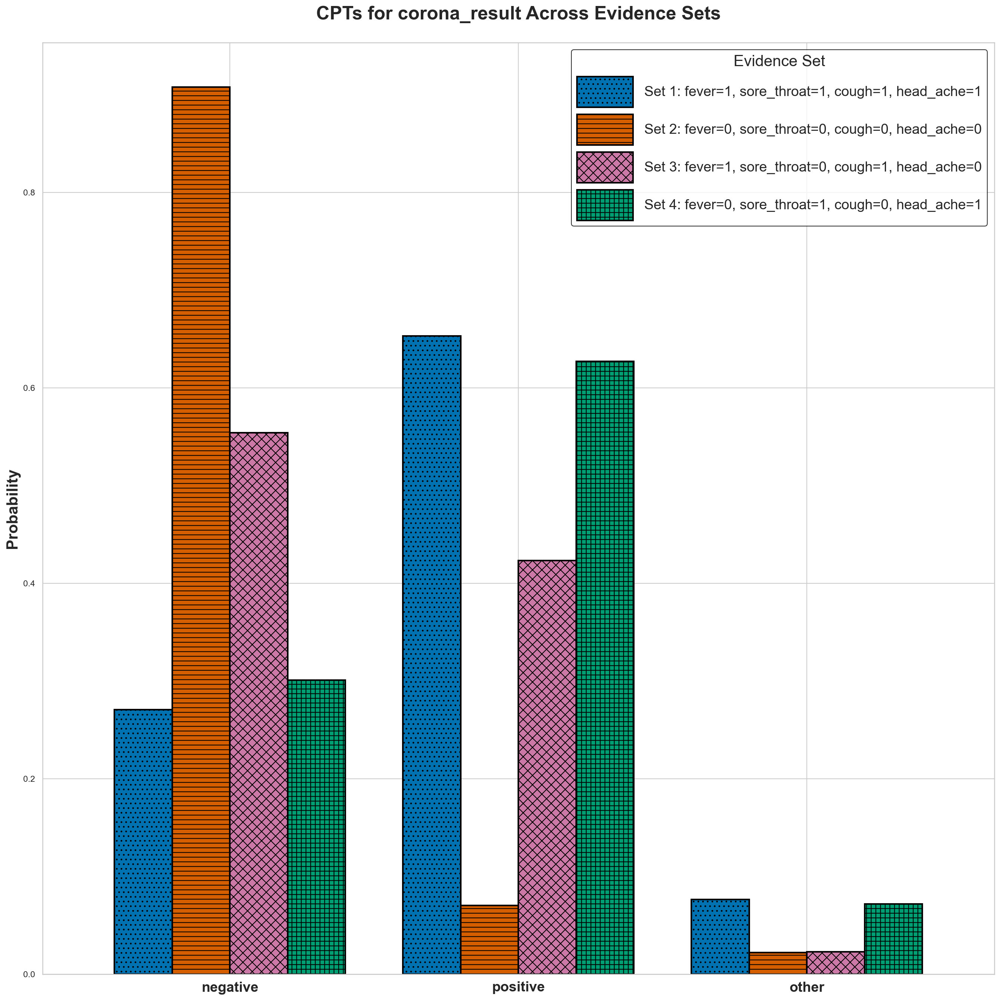

In [45]:
import matplotlib.pyplot as plt
from pgmpy.inference import VariableElimination
import pandas as pd
import matplotlib.patches as mpatches

def compare_cpts_with_labels(model, variable, result_labels):
    inference = VariableElimination(model)

    cpts = {}
    set_labels = []
    colors = ['#0072B2', '#D55E00', '#CC79A7', '#009E73']  # Blue, Orange, Pink, Teal
    hatch_patterns = ['..', '--', 'xx', '++']  # Simplified and distinct
    
    evidence_sets = [
        {'fever': 1, 'sore_throat': 1, 'cough': 1, 'head_ache': 1},
        {'fever': 0, 'sore_throat': 0, 'cough': 0, 'head_ache': 0},
        {'fever': 1, 'sore_throat': 0, 'cough': 1, 'head_ache': 0},
        {'fever': 0, 'sore_throat': 1, 'cough': 0, 'head_ache': 1},
    ]
    
    for i, evidence in enumerate(evidence_sets):
        query = inference.query(variables=[variable], evidence=evidence, show_progress=False)
        labeled_query = {result_labels[i]: prob for i, prob in enumerate(query.values)}
        cpts[f'Set {i+1}'] = [labeled_query[label] for label in result_labels]
        evidence_desc = ', '.join([f'{k}={v}' for k, v in evidence.items()])
        set_labels.append(f'Set {i+1}: {evidence_desc}')

    cpts_df = pd.DataFrame(cpts, index=result_labels)
    print(cpts_df)
    
    # Plotting
    fig, ax = plt.subplots(figsize=(18, 18), dpi=150)
    bars = cpts_df.plot(kind='bar', ax=ax, color=colors, width=0.8)
    
    # Apply hatches with thicker lines
    for i, bar in enumerate(bars.containers):
        for patch in bar:
            patch.set_hatch(hatch_patterns[i])
            patch.set_edgecolor('black')
            patch.set_linewidth(2)  # Thicker lines for visibility
    
    ax.set_ylabel("Probability", fontsize=20, fontweight='bold')
    ax.set_title(f'CPTs for {variable} Across Evidence Sets', fontsize=24, fontweight='bold', pad=30)
    ax.set_xticklabels(result_labels, rotation=0, fontsize=18, fontweight='bold')
    
    # Create legend with larger handles and simplified patterns
    handles = []
    for i, (color, hatch) in enumerate(zip(colors, hatch_patterns)):
        patch = mpatches.Patch(
            facecolor=color,
            hatch=hatch,
            edgecolor='black',
            linewidth=2,  # Match bar edge thickness
            label=set_labels[i]
        )
        handles.append(patch)
    
    ax.legend(
        handles=handles,
        title="Evidence Set",
        loc='upper right',
        bbox_to_anchor=(1, 1),
        fontsize=18,  # Larger font
        title_fontsize=20,
        edgecolor='black',
        handleheight=3,  # Larger handle height
        handlelength=4,   # Larger handle length
    )
    
    plt.tight_layout()
    plt.show()

# Example usage
result_labels = ['negative', 'positive', 'other']
compare_cpts_with_labels(model, 'corona_result', result_labels)

In [21]:
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix

def calculate_metrics_and_confusion_matrix(model, data, actual_var):
    from pgmpy.inference import VariableElimination

    inference = VariableElimination(model)
    correct_predictions = 0
    true_labels = []
    predicted_labels = []

    for i, row in data.iterrows():
        evidence = row.drop(actual_var).to_dict()
        actual = row[actual_var]
        query = inference.map_query(variables=[actual_var], evidence=evidence, show_progress=False)
        
        true_labels.append(actual)
        predicted_labels.append(query[actual_var])
        
        if query[actual_var] == actual:
            correct_predictions += 1

    accuracy = correct_predictions / len(data)
    precision = precision_score(true_labels, predicted_labels, average='weighted')
    recall = recall_score(true_labels, predicted_labels, average='weighted')
    f1 = f1_score(true_labels, predicted_labels, average='weighted')
    cm = confusion_matrix(true_labels, predicted_labels)

    print(f'Predictive Accuracy: {accuracy * 100:.2f}%')
    print(f'Precision: {precision * 100:.2f}%')
    print(f'Recall: {recall * 100:.2f}%')
    print(f'F1 Score: {f1 * 100:.2f}%')

    return accuracy * 100, precision * 100, recall * 100, f1 * 100, cm

# Sampling a manageable portion of df_test (e.g., 0.1% of the data)
df_test_sample = df_test.sample(frac=0.001, random_state=42)

# Perform the metrics and confusion matrix calculation on the sampled data
accuracy, precision, recall, f1, cm = calculate_metrics_and_confusion_matrix(model, df_test_sample, 'corona_result')


Predictive Accuracy: 95.34%
Precision: 94.49%
Recall: 95.34%
F1 Score: 94.05%


C:\Users\dr.wagan\AppData\Local\anaconda3\envs\thirdpaper\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Saved as model_performance_metrics.png (150 DPI, 12x10 inches)


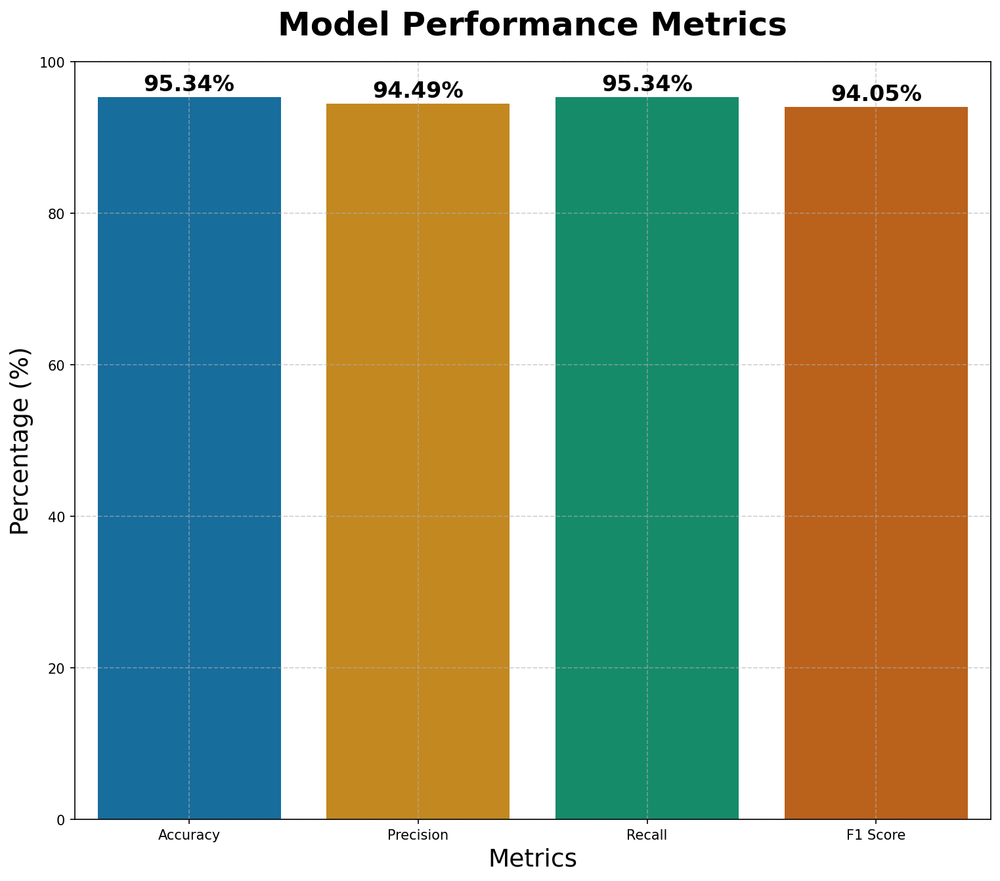

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Metrics to plot
metrics = {
    "Accuracy": accuracy,
    "Precision": precision,
    "Recall": recall,
    "F1 Score": f1
}

# Set up the figure for the performance metrics
fig, ax = plt.subplots(figsize=(12, 10), dpi=150)  # High resolution for clear images

# Use a color-blind friendly palette
colors = sns.color_palette("colorblind")

# Plot the metrics as a bar chart
sns.barplot(x=list(metrics.keys()), y=list(metrics.values()), palette=colors, ax=ax)

# Customize title and labels for better readability in research papers
ax.set_title("Model Performance Metrics", fontsize=24, fontweight='bold', pad=20)
ax.set_ylabel("Percentage (%)", fontsize=18)
ax.set_xlabel("Metrics", fontsize=18)
ax.set_ylim(0, 100)  # Set the y-axis from 0 to 100%

# Annotate the bars with the percentage values
for p in ax.patches:
    ax.annotate(f'{p.get_height():.2f}%', 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                xytext=(0, 9), 
                textcoords='offset points', 
                fontsize=16, fontweight='bold')

# Improve grid visibility
ax.grid(True, linestyle='--', alpha=0.6)

# Save the image automatically with high resolution
output_file = "model_performance_metrics.png"
fig.savefig(output_file, bbox_inches='tight', dpi=150)
print(f"Saved as {output_file} (150 DPI, 12x10 inches)")

plt.show()


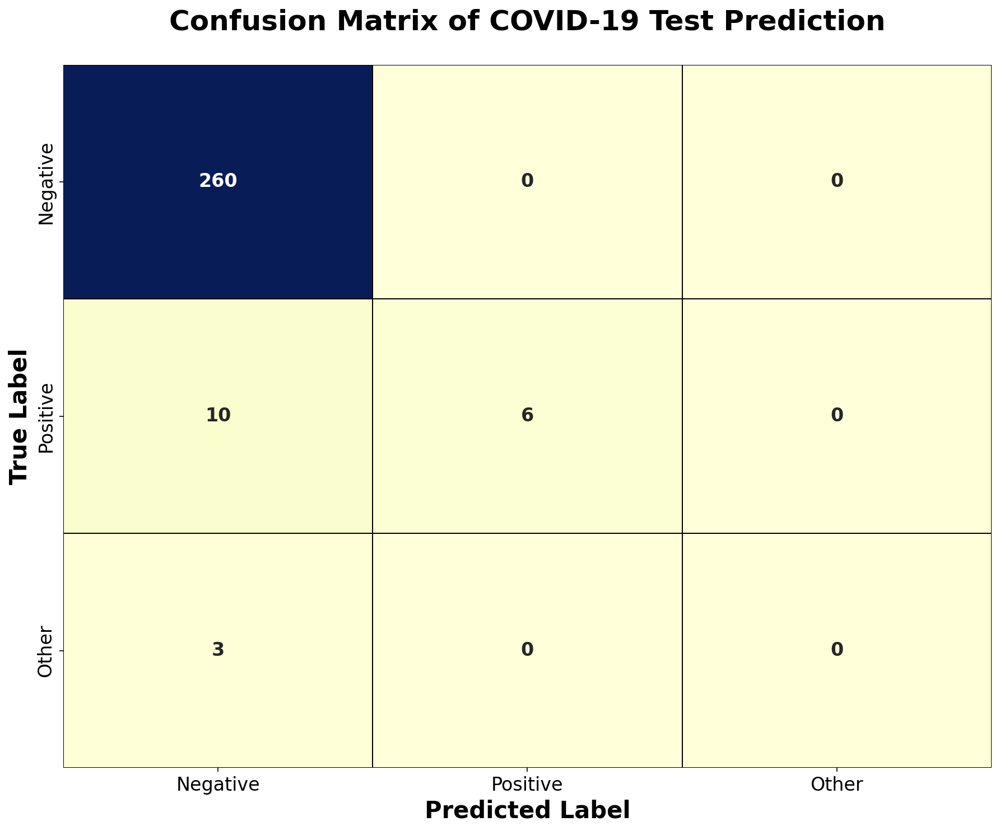

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the figure for the confusion matrix (Higher resolution and colorblind-friendly)
fig, ax = plt.subplots(figsize=(12, 10), dpi=150)

# Use a colorblind-friendly palette (cividis)
sns.heatmap(cm, annot=True, fmt='d', cmap='YlGnBu', ax=ax, cbar=False,
            xticklabels=['Negative', 'Positive', 'Other'], 
            yticklabels=['Negative', 'Positive', 'Other'],
            linewidths=0.8, linecolor='black', annot_kws={"size": 16, "fontweight": 'bold'})

# Enhance titles and labels for better clarity in research papers
ax.set_title("Confusion Matrix of COVID-19 Test Prediction", fontsize=24, fontweight='bold', pad=30)
ax.set_xlabel("Predicted Label", fontsize=20, fontweight='bold')
ax.set_ylabel("True Label", fontsize=20, fontweight='bold')

# Customize tick parameters for better readability
ax.xaxis.set_tick_params(labelsize=16)
ax.yaxis.set_tick_params(labelsize=16)

# Remove grid for a cleaner look
plt.grid(False)

# Save the figure with high resolution
plt.savefig("confusion_matrix_high_res.png", bbox_inches='tight', dpi=150)

plt.tight_layout()
plt.show()


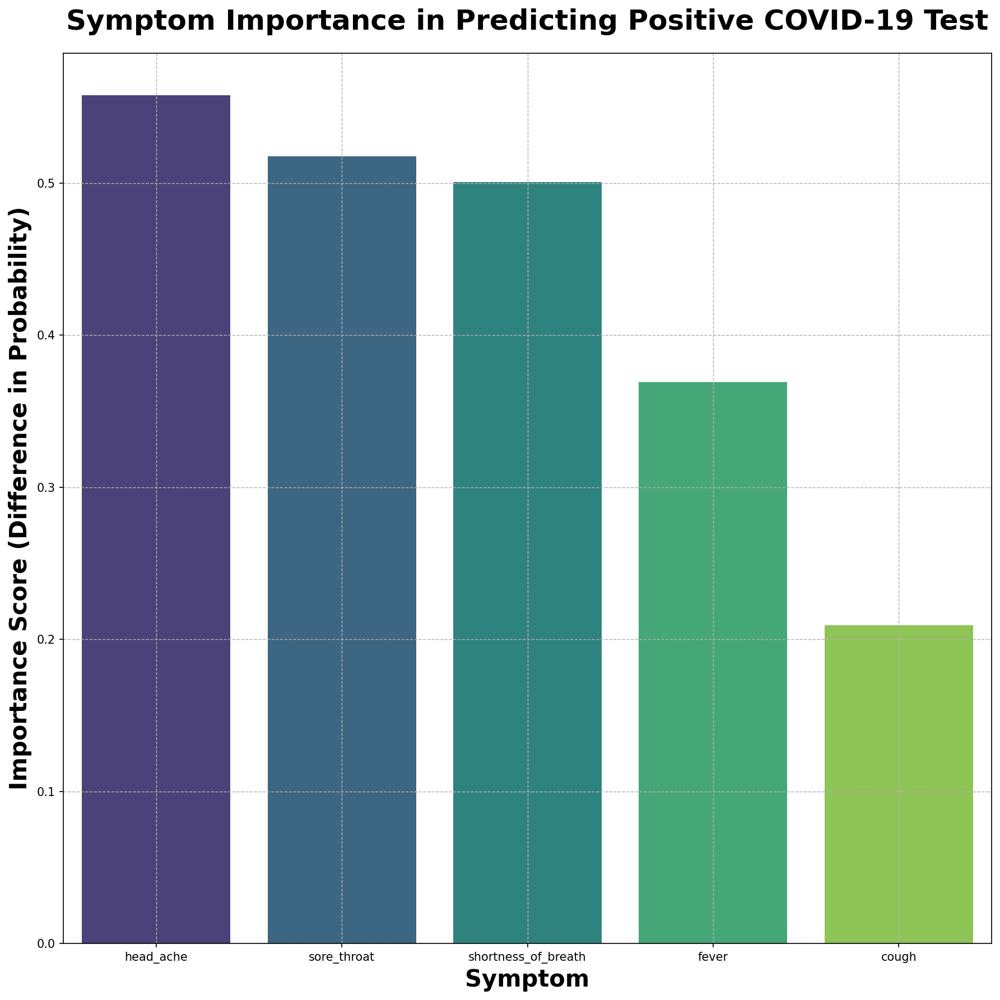

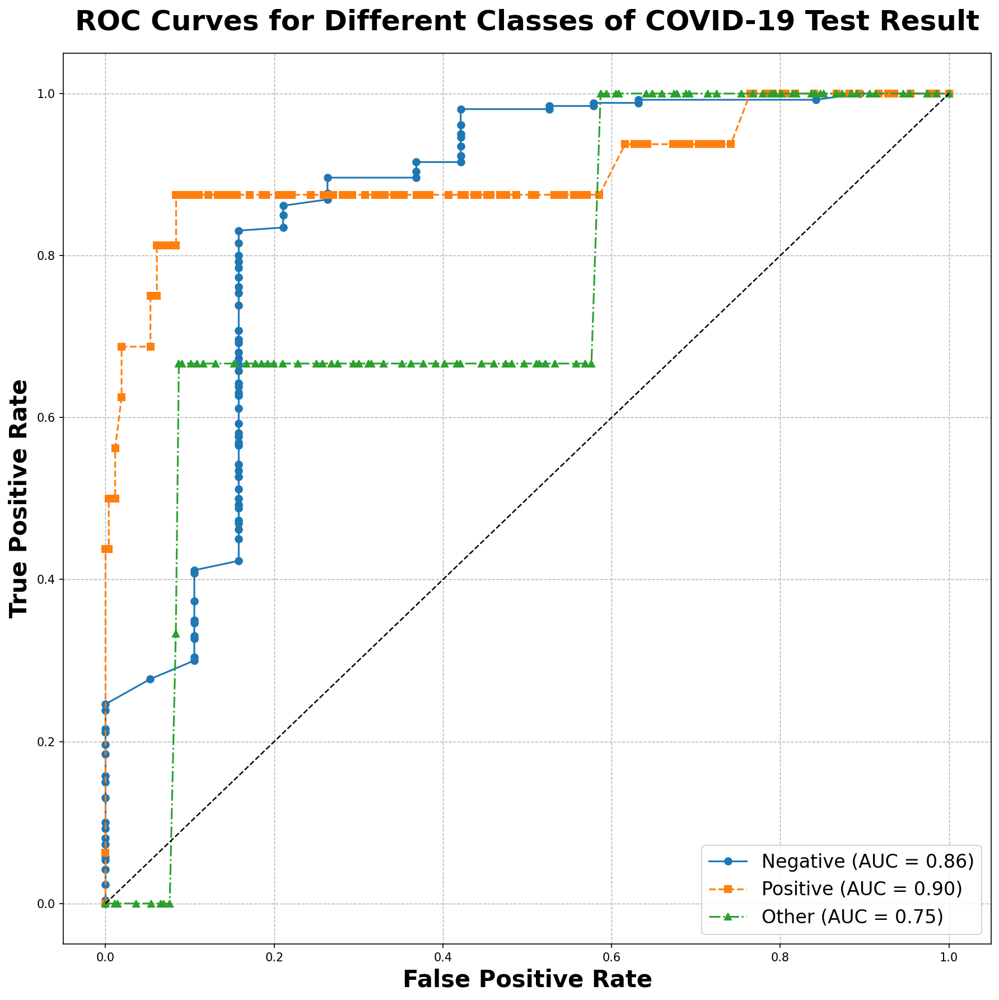

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pgmpy.models import BayesianModel
from pgmpy.estimators import BayesianEstimator
from pgmpy.inference import VariableElimination
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Define the complete Bayesian Network structure
architecture = [
    ("test_date", "corona_result"),
    ("cough", "corona_result"),
    ("fever", "corona_result"),
    ("sore_throat", "corona_result"),
    ("shortness_of_breath", "corona_result"),
    ("head_ache", "corona_result"),
    ("age_60_and_above", "corona_result"),
    ("test_indication", "corona_result"),
    ("gender", "corona_result")
]

# Create and train the Bayesian Network
model = BayesianModel(architecture)
model.fit(updated_df1, estimator=BayesianEstimator, prior_type="BDeu", equivalent_sample_size=10)
inference = VariableElimination(model)

# Function to compute and plot the importance of each symptom in predicting a positive test result
def plot_symptom_importance(model, target="corona_result"):
    importance_scores = {}
    
    # Get all the parent nodes (symptoms) that directly influence the target node (corona_result)
    symptom_nodes = ["cough", "fever", "sore_throat", "shortness_of_breath", "head_ache"]
    
    for var in symptom_nodes:
        prob_positive_given_symptom = inference.query(variables=[target], evidence={var: 1}, show_progress=False).values[1]
        prob_positive_given_no_symptom = inference.query(variables=[target], evidence={var: 0}, show_progress=False).values[1]
        importance = prob_positive_given_symptom - prob_positive_given_no_symptom
        importance_scores[var] = importance

    sorted_scores = {k: v for k, v in sorted(importance_scores.items(), key=lambda item: abs(item[1]), reverse=True)}

    # Plotting the importance
    plt.figure(figsize=(12, 12), dpi=150)
    sns.barplot(x=list(sorted_scores.keys()), y=list(sorted_scores.values()), palette="viridis")
    plt.title("Symptom Importance in Predicting Positive COVID-19 Test", fontsize=24, fontweight='bold', pad=20)
    plt.xlabel("Symptom", fontsize=20, fontweight='bold')
    plt.ylabel("Importance Score (Difference in Probability)", fontsize=20, fontweight='bold')
    plt.grid(True, linestyle='--', linewidth=0.7)
    plt.tight_layout()
    plt.savefig("symptom_importance_high_res.png", bbox_inches='tight', dpi=150)
    plt.show()

# Run and plot the symptom importance
plot_symptom_importance(model)

# Function to compute and plot ROC curves for each class in a multiclass problem
def plot_roc_curves(inference, data, target="corona_result"):
    plt.figure(figsize=(12, 12), dpi=150)
    
    actuals = label_binarize(data[target], classes=[0, 1, 2])  # Convert the target to binary format
    symptom_nodes = ["cough", "fever", "sore_throat", "shortness_of_breath", "head_ache"]
    markers = ['o', 's', '^']  # Distinct markers for each class
    line_styles = ['-', '--', '-.']
    
    for i, (class_label, marker, style) in enumerate(zip(["Negative", "Positive", "Other"], markers, line_styles)):
        probs = []
        for _, row in data.iterrows():
            evidence = {col: row[col] for col in row.index if col != target}
            prob = inference.query(variables=[target], evidence=evidence, show_progress=False).values[i]
            probs.append(prob)
        
        fpr, tpr, _ = roc_curve(actuals[:, i], probs)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{class_label} (AUC = {roc_auc:.2f})', linestyle=style, marker=marker, markersize=6)
    
    plt.plot([0, 1], [0, 1], 'k--', linewidth=1.2)
    plt.title("ROC Curves for Different Classes of COVID-19 Test Result", fontsize=24, fontweight='bold', pad=20)
    plt.xlabel("False Positive Rate", fontsize=20, fontweight='bold')
    plt.ylabel("True Positive Rate", fontsize=20, fontweight='bold')
    plt.legend(loc="lower right", fontsize=16)
    plt.grid(True, linestyle='--', linewidth=0.7)
    plt.tight_layout()
    plt.savefig("roc_curves_high_res.png", bbox_inches='tight', dpi=150)
    plt.show()

# Sample a manageable portion of df_test to create the ROC curves
df_test_sample = df_test.sample(frac=0.001, random_state=42)

# Run and plot the ROC curves
plot_roc_curves(inference, df_test_sample)


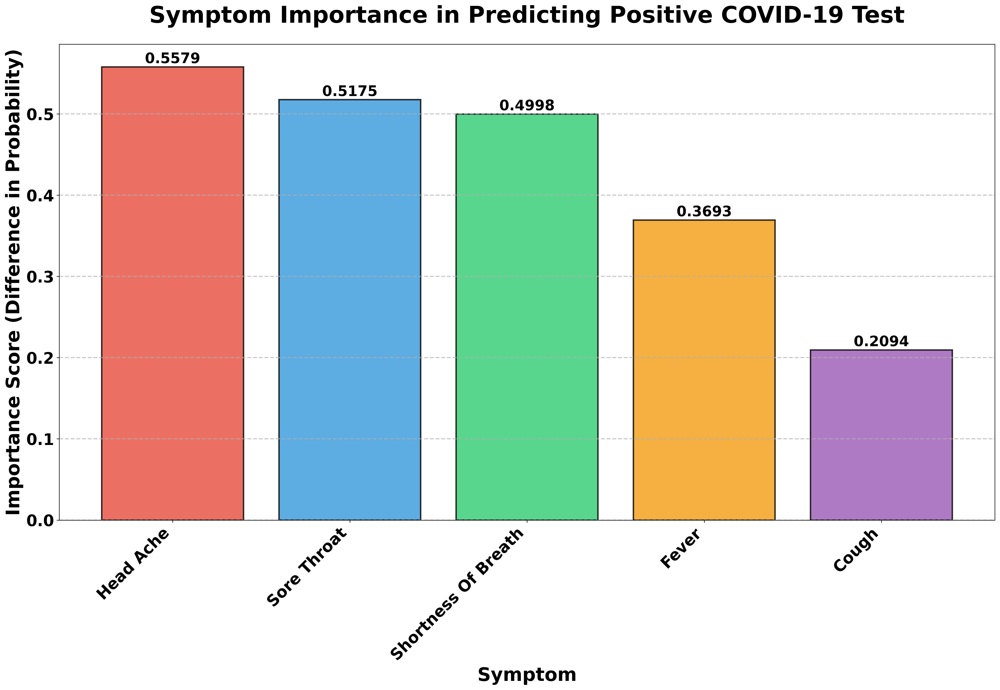

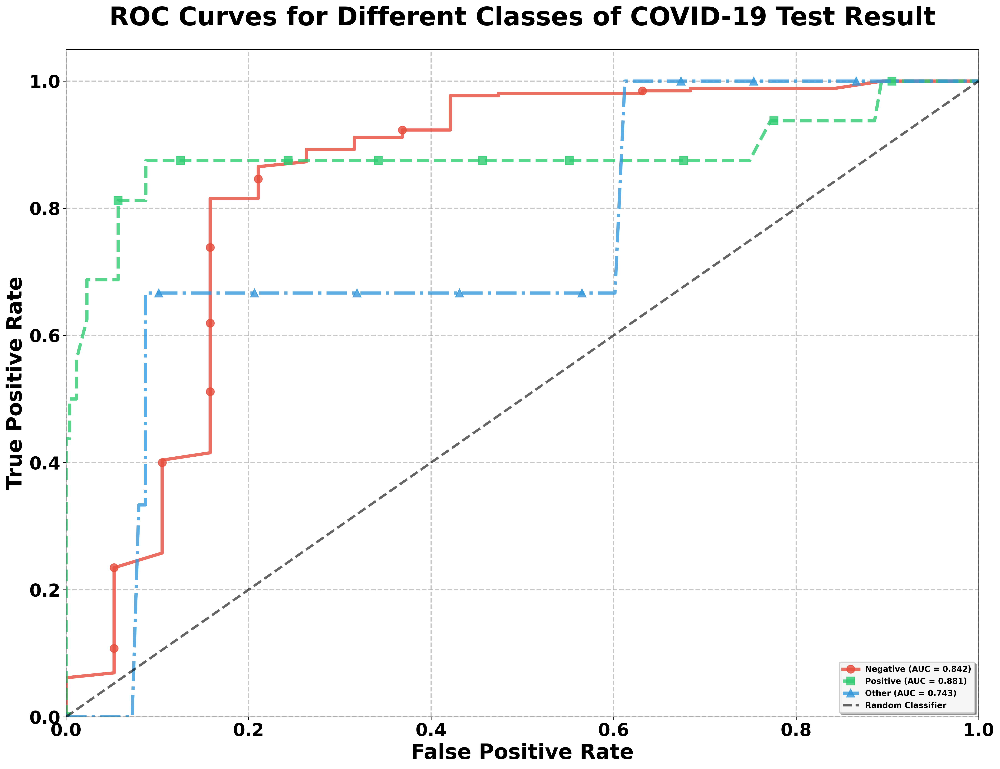

In [23]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pgmpy.models import BayesianModel
from pgmpy.estimators import BayesianEstimator
from pgmpy.inference import VariableElimination
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Define the complete Bayesian Network structure
architecture = [
    ("test_date", "corona_result"),
    ("cough", "corona_result"),
    ("fever", "corona_result"),
    ("sore_throat", "corona_result"),
    ("shortness_of_breath", "corona_result"),
    ("head_ache", "corona_result"),
    ("age_60_and_above", "corona_result"),
    ("test_indication", "corona_result"),
    ("gender", "corona_result")
]

# Create and train the Bayesian Network
model = BayesianModel(architecture)
model.fit(updated_df1, estimator=BayesianEstimator, prior_type="BDeu", equivalent_sample_size=10)
inference = VariableElimination(model)

# Function to compute and plot the importance of each symptom in predicting a positive test result
def plot_symptom_importance(model, target="corona_result"):
    importance_scores = {}
    
    # Get all the parent nodes (symptoms) that directly influence the target node (corona_result)
    symptom_nodes = ["cough", "fever", "sore_throat", "shortness_of_breath", "head_ache"]
    
    for var in symptom_nodes:
        prob_positive_given_symptom = inference.query(variables=[target], evidence={var: 1}, show_progress=False).values[1]
        prob_positive_given_no_symptom = inference.query(variables=[target], evidence={var: 0}, show_progress=False).values[1]
        importance = prob_positive_given_symptom - prob_positive_given_no_symptom
        importance_scores[var] = importance

    sorted_scores = {k: v for k, v in sorted(importance_scores.items(), key=lambda item: abs(item[1]), reverse=True)}

    # Plotting the importance with enhanced visibility
    plt.figure(figsize=(20, 14), dpi=300)  # Much larger figure with high DPI
    
    # Create the bar plot with enhanced styling
    bars = plt.bar(range(len(sorted_scores)), list(sorted_scores.values()), 
                   color=['#e74c3c', '#3498db', '#2ecc71', '#f39c12', '#9b59b6'], 
                   edgecolor='black', linewidth=2, alpha=0.8)
    
    # Customize the plot
    plt.title("Symptom Importance in Predicting Positive COVID-19 Test", 
              fontsize=32, fontweight='bold', pad=30)
    plt.xlabel("Symptom", fontsize=26, fontweight='bold')
    plt.ylabel("Importance Score (Difference in Probability)", fontsize=26, fontweight='bold')
    
    # Set x-axis labels with better formatting
    plt.xticks(range(len(sorted_scores)), 
               [label.replace('_', ' ').title() for label in sorted_scores.keys()], 
               fontsize=22, fontweight='bold', rotation=45, ha='right')
    plt.yticks(fontsize=22, fontweight='bold')
    
    # Add value labels on top of bars
    for i, (bar, value) in enumerate(zip(bars, sorted_scores.values())):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.001, 
                f'{value:.4f}', ha='center', va='bottom', 
                fontsize=20, fontweight='bold')
    
    # Enhanced grid
    plt.grid(True, linestyle='--', linewidth=1.5, alpha=0.7, axis='y')
    
    # Adjust layout
    plt.tight_layout(pad=3.0)
    
    # Save with high resolution
    plt.savefig("symptom_importance_high_res.png", bbox_inches='tight', dpi=300, 
                facecolor='white', edgecolor='none')
    plt.show()

# Run and plot the symptom importance
plot_symptom_importance(model)

# Function to compute and plot ROC curves for each class in a multiclass problem
def plot_roc_curves(inference, data, target="corona_result"):
    plt.figure(figsize=(18, 14), dpi=300)  # Much larger figure with high DPI
    
    actuals = label_binarize(data[target], classes=[0, 1, 2])  # Convert the target to binary format
    symptom_nodes = ["cough", "fever", "sore_throat", "shortness_of_breath", "head_ache"]
    
    # Enhanced styling for curves
    colors = ['#e74c3c', '#2ecc71', '#3498db']  # Distinct colors
    markers = ['o', 's', '^']  # Distinct markers for each class
    line_styles = ['-', '--', '-.']
    
    for i, (class_label, marker, style, color) in enumerate(zip(["Negative", "Positive", "Other"], 
                                                               markers, line_styles, colors)):
        probs = []
        for _, row in data.iterrows():
            evidence = {col: row[col] for col in row.index if col != target}
            prob = inference.query(variables=[target], evidence=evidence, show_progress=False).values[i]
            probs.append(prob)
        
        fpr, tpr, _ = roc_curve(actuals[:, i], probs)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{class_label} (AUC = {roc_auc:.3f})', 
                linestyle=style, marker=marker, markersize=10, linewidth=4, 
                color=color, markevery=10, alpha=0.8)
    
    # Diagonal reference line
    plt.plot([0, 1], [0, 1], 'k--', linewidth=3, alpha=0.6, label='Random Classifier')
    
    # Enhanced formatting
    plt.title("ROC Curves for Different Classes of COVID-19 Test Result", 
              fontsize=32, fontweight='bold', pad=30)
    plt.xlabel("False Positive Rate", fontsize=26, fontweight='bold')
    plt.ylabel("True Positive Rate", fontsize=26, fontweight='bold')
    
    # Enhanced axis formatting
    plt.xticks(fontsize=22, fontweight='bold')
    plt.yticks(fontsize=22, fontweight='bold')
    
    # Enhanced legend
    legend = plt.legend(loc="lower right", fontsize=20, frameon=True, 
                       fancybox=True, shadow=True, prop={'weight': 'bold'})
    legend.get_frame().set_linewidth(2)
    legend.get_frame().set_facecolor('white')
    legend.get_frame().set_alpha(0.9)
    
    # Enhanced grid
    plt.grid(True, linestyle='--', linewidth=1.5, alpha=0.7)
    
    # Set axis limits and aspect
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    
    # Adjust layout
    plt.tight_layout(pad=3.0)
    
    # Save with high resolution
    plt.savefig("roc_curves_high_res.png", bbox_inches='tight', dpi=300, 
                facecolor='white', edgecolor='none')
    plt.show()

# Sample a manageable portion of df_test to create the ROC curves
df_test_sample = df_test.sample(frac=0.001, random_state=42)

# Run and plot the ROC curves
plot_roc_curves(inference, df_test_sample)

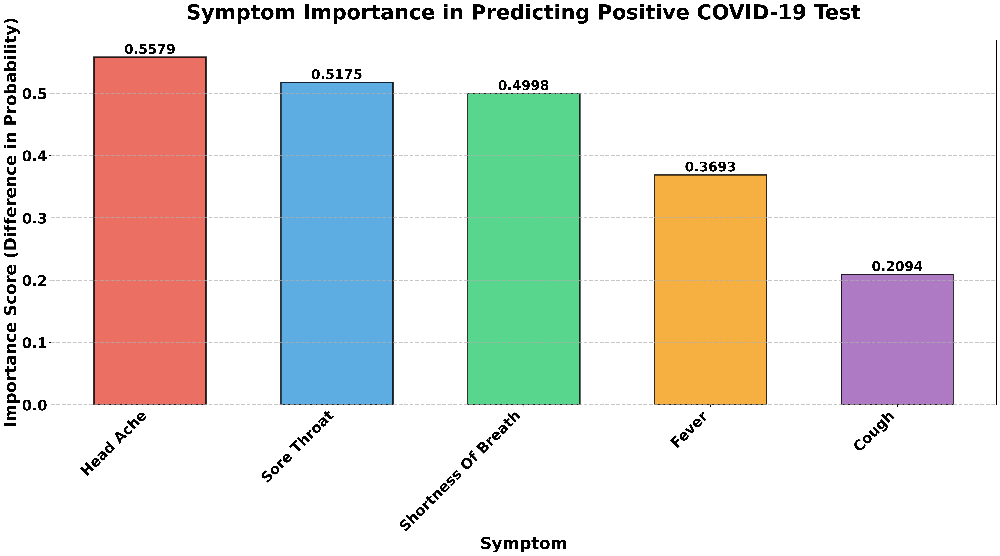

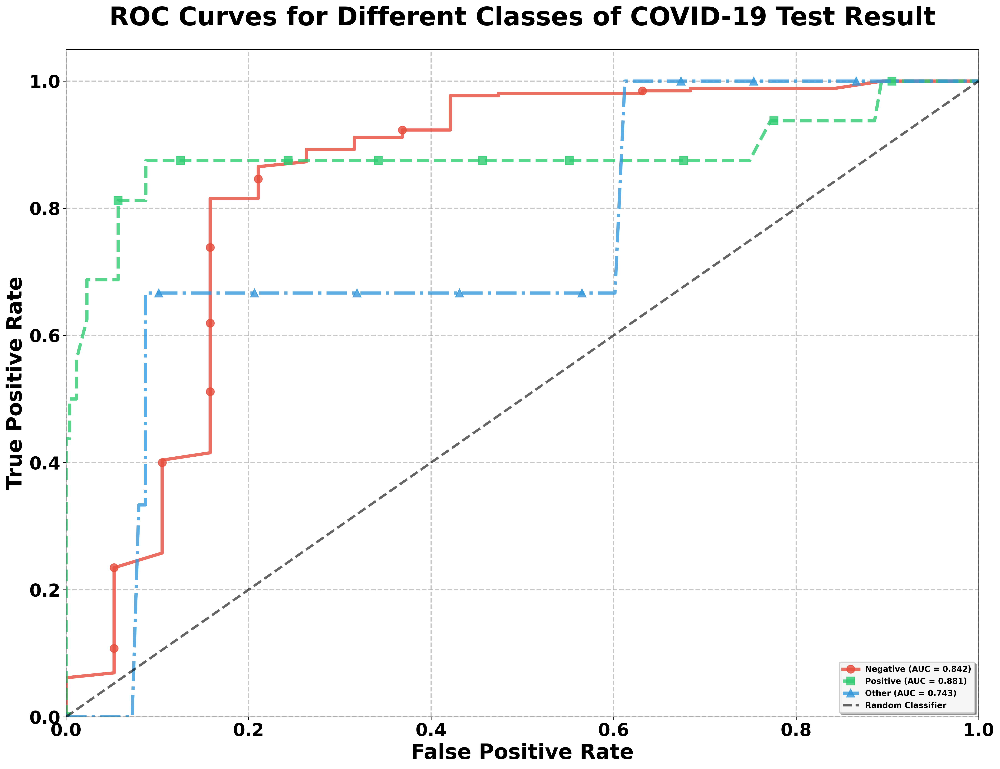

In [24]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pgmpy.models import BayesianModel
from pgmpy.estimators import BayesianEstimator
from pgmpy.inference import VariableElimination
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Define the complete Bayesian Network structure
architecture = [
    ("test_date", "corona_result"),
    ("cough", "corona_result"),
    ("fever", "corona_result"),
    ("sore_throat", "corona_result"),
    ("shortness_of_breath", "corona_result"),
    ("head_ache", "corona_result"),
    ("age_60_and_above", "corona_result"),
    ("test_indication", "corona_result"),
    ("gender", "corona_result")
]

# Create and train the Bayesian Network
model = BayesianModel(architecture)
model.fit(updated_df1, estimator=BayesianEstimator, prior_type="BDeu", equivalent_sample_size=10)
inference = VariableElimination(model)

# Function to compute and plot the importance of each symptom in predicting a positive test result
def plot_symptom_importance(model, target="corona_result"):
    importance_scores = {}
    
    # Get all the parent nodes (symptoms) that directly influence the target node (corona_result)
    symptom_nodes = ["cough", "fever", "sore_throat", "shortness_of_breath", "head_ache"]
    
    for var in symptom_nodes:
        prob_positive_given_symptom = inference.query(variables=[target], evidence={var: 1}, show_progress=False).values[1]
        prob_positive_given_no_symptom = inference.query(variables=[target], evidence={var: 0}, show_progress=False).values[1]
        importance = prob_positive_given_symptom - prob_positive_given_no_symptom
        importance_scores[var] = importance

    sorted_scores = {k: v for k, v in sorted(importance_scores.items(), key=lambda item: abs(item[1]), reverse=True)}

    # Plotting the importance with much larger and wider figure
    plt.figure(figsize=(28, 16), dpi=300)  # Much larger and wider figure
    
    # Create the bar plot with enhanced styling
    bars = plt.bar(range(len(sorted_scores)), list(sorted_scores.values()), 
                   color=['#e74c3c', '#3498db', '#2ecc71', '#f39c12', '#9b59b6'], 
                   edgecolor='black', linewidth=3, alpha=0.8, width=0.6)
    
    # Customize the plot with larger text
    plt.title("Symptom Importance in Predicting Positive COVID-19 Test", 
              fontsize=40, fontweight='bold', pad=40)
    plt.xlabel("Symptom", fontsize=32, fontweight='bold')
    plt.ylabel("Importance Score (Difference in Probability)", fontsize=32, fontweight='bold')
    
    # Set x-axis labels with better formatting and larger text
    plt.xticks(range(len(sorted_scores)), 
               [label.replace('_', ' ').title() for label in sorted_scores.keys()], 
               fontsize=28, fontweight='bold', rotation=45, ha='right')
    plt.yticks(fontsize=28, fontweight='bold')
    
    # Add value labels on top of bars with larger text
    for i, (bar, value) in enumerate(zip(bars, sorted_scores.values())):
        plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.001, 
                f'{value:.4f}', ha='center', va='bottom', 
                fontsize=26, fontweight='bold')
    
    # Enhanced grid
    plt.grid(True, linestyle='--', linewidth=2, alpha=0.7, axis='y')
    
    # Adjust layout with more padding
    plt.tight_layout(pad=4.0)
    
    # Save with high resolution
    plt.savefig("symptom_importance_high_res.png", bbox_inches='tight', dpi=300, 
                facecolor='white', edgecolor='none')
    plt.show()

# Run and plot the symptom importance
plot_symptom_importance(model)

# Function to compute and plot ROC curves for each class in a multiclass problem
def plot_roc_curves(inference, data, target="corona_result"):
    plt.figure(figsize=(18, 14), dpi=300)  # Much larger figure with high DPI
    
    actuals = label_binarize(data[target], classes=[0, 1, 2])  # Convert the target to binary format
    symptom_nodes = ["cough", "fever", "sore_throat", "shortness_of_breath", "head_ache"]
    
    # Enhanced styling for curves
    colors = ['#e74c3c', '#2ecc71', '#3498db']  # Distinct colors
    markers = ['o', 's', '^']  # Distinct markers for each class
    line_styles = ['-', '--', '-.']
    
    for i, (class_label, marker, style, color) in enumerate(zip(["Negative", "Positive", "Other"], 
                                                               markers, line_styles, colors)):
        probs = []
        for _, row in data.iterrows():
            evidence = {col: row[col] for col in row.index if col != target}
            prob = inference.query(variables=[target], evidence=evidence, show_progress=False).values[i]
            probs.append(prob)
        
        fpr, tpr, _ = roc_curve(actuals[:, i], probs)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f'{class_label} (AUC = {roc_auc:.3f})', 
                linestyle=style, marker=marker, markersize=10, linewidth=4, 
                color=color, markevery=10, alpha=0.8)
    
    # Diagonal reference line
    plt.plot([0, 1], [0, 1], 'k--', linewidth=3, alpha=0.6, label='Random Classifier')
    
    # Enhanced formatting
    plt.title("ROC Curves for Different Classes of COVID-19 Test Result", 
              fontsize=32, fontweight='bold', pad=30)
    plt.xlabel("False Positive Rate", fontsize=26, fontweight='bold')
    plt.ylabel("True Positive Rate", fontsize=26, fontweight='bold')
    
    # Enhanced axis formatting
    plt.xticks(fontsize=22, fontweight='bold')
    plt.yticks(fontsize=22, fontweight='bold')
    
    # Enhanced legend
    legend = plt.legend(loc="lower right", fontsize=20, frameon=True, 
                       fancybox=True, shadow=True, prop={'weight': 'bold'})
    legend.get_frame().set_linewidth(2)
    legend.get_frame().set_facecolor('white')
    legend.get_frame().set_alpha(0.9)
    
    # Enhanced grid
    plt.grid(True, linestyle='--', linewidth=1.5, alpha=0.7)
    
    # Set axis limits and aspect
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    
    # Adjust layout
    plt.tight_layout(pad=3.0)
    
    # Save with high resolution
    plt.savefig("roc_curves_high_res.png", bbox_inches='tight', dpi=300, 
                facecolor='white', edgecolor='none')
    plt.show()

# Sample a manageable portion of df_test to create the ROC curves
df_test_sample = df_test.sample(frac=0.001, random_state=42)

# Run and plot the ROC curves
plot_roc_curves(inference, df_test_sample)